In [1]:
import numpy as np
import xarray as xr
import xesmf as xe
from eofs.xarray import Eof
from eofs.examples import example_data_path
import xgcm
from sklearn import preprocessing
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
from scipy import stats

import matplotlib.pyplot as plt
import cartopy.feature as cft
import cartopy.crs as ccrs
import cmocean as cm

from gsw import sigma2, SA_from_SP, p_from_z, rho

import cosima_cookbook as cc
import gcm_filters
import os

import cartopy.feature as cfeature

# Avoid the Runtime errors in true_divide encountered when trying to divide by zero
import warnings
warnings.filterwarnings('ignore', category = RuntimeWarning)
warnings.filterwarnings('ignore', category = UserWarning)
warnings.simplefilter('ignore')

In [2]:
import dask
from dask.distributed import Client
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/42333/status,
Dashboard: /proxy/42333/status,Workers: 7
Total threads: 28,Total memory: 251.19 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34567,Workers: 7
Dashboard: /proxy/42333/status,Total threads: 28
Started: Just now,Total memory: 251.19 GiB
Comm: tcp://127.0.0.1:44987,Total threads: 4
Dashboard: /proxy/45749/status,Memory: 35.88 GiB
Nanny: tcp://127.0.0.1:40795,


In [3]:
start_time, end_time = '2001-01-01', '2100-12-31'
x_min, x_max = -100, 10
y_min, y_max = 10, 75
ρ0 = 1035

In [4]:
base_dir = '/g/data/x77/db6174/Project_3/North-Atlantic-Oscillation-tests/NETCDF/'
dir_names = ['Monthly_mean_BVB_MOM6-SIS2_negativeNAO-2.0', 
             'Monthly_mean_BVB_MOM6-SIS2_negativeNAO-1.0', 
             'Monthly_mean_BVB_MOM6-SIS2_RYF_control', 
             'Monthly_mean_BVB_MOM6-SIS2_positiveNAO-1.0',
             'Monthly_mean_BVB_MOM6-SIS2_positiveNAO-2.0']

expt = ['mom6-om4-025-RYF-negativeNAO-2.0', 
        'mom6-om4-025-RYF-negativeNAO-1.0', 
        'mom6-om4-025-RYF-control', 
        'mom6-om4-025-RYF-positiveNAO-1.0',
        'mom6-om4-025-RYF-positiveNAO-2.0']

db = '/scratch/x77/db6174/mom6/archive/databases/cc_database_RYF_control.db'
session = cc.database.create_session(db)

In [5]:
var_list = ['beta_v', 'BPT', 'curl_NL', 'curl_taus', 'curl_taub', 'curl_diff', 'mass_flux', 'curl_dudt', 'eta_dt']
expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

### Overturning circulation

In [6]:
ht = cc.querying.getvar(expt[2], 'deptho', session, n=-1) 
land_mask = ~ht.isnull()
ρ0 = 1035

In [7]:
## create masks out of the above chunks
south_map = (land_mask.where(land_mask.yh < -34)).fillna(0)
indo_map1 = (land_mask.where(land_mask.yh < 9).where(land_mask.yh > -34).where(land_mask.xh > -280).where(land_mask.xh < -65)).fillna(0)
indo_map2 = (land_mask.where(land_mask.yh < 15).where(land_mask.yh > 9).where(land_mask.xh > -280).where(land_mask.xh < -83.7)).fillna(0)
indo_map3 = (land_mask.where(land_mask.yh < 17).where(land_mask.yh > 15).where(land_mask.xh > -280).where(land_mask.xh < -93.3)).fillna(0)
indo_map4 = (land_mask.where(land_mask.yh < 85).where(land_mask.yh > 17).where(land_mask.xh > -280).where(land_mask.xh < -99)).fillna(0)
indo_map5 = (land_mask.where(land_mask.yh < 30.5).where(land_mask.yh > -34).where(land_mask.xh > 25).where(land_mask.xh < 80)).fillna(0)

indo_sector_map = indo_map1 + indo_map2 + indo_map3 + indo_map4 + indo_map5 + south_map
indo_sector_mask = indo_sector_map.where(indo_sector_map>0)

atlantic_sector_map = (indo_sector_mask * 0).fillna(1) * land_mask
atlantic_sector_map = atlantic_sector_map + south_map
atlantic_sector_mask = atlantic_sector_map.where(atlantic_sector_map > 0)

In [8]:
umo_2d = cc.querying.getvar(expt[2], 'umo_2d', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).isel(xq = slice(1, None)).sel(time = slice('2081-01-01', end_time))
vmo_2d = cc.querying.getvar(expt[2], 'vmo_2d', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice('2081-01-01', end_time))

grid_data = xr.merge((umo_2d, vmo_2d))
grid = xgcm.Grid(grid_data, coords={'X': {'center': 'xh', 'right': 'xq'}, 'Y': {'center': 'yh', 'right': 'yq'}}, periodic=['X'])

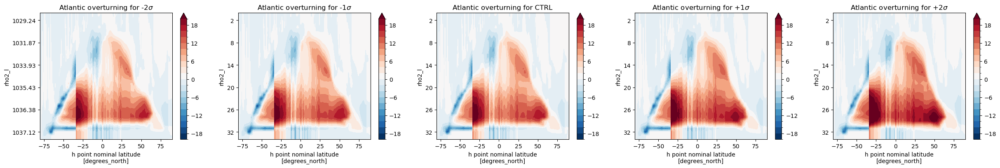

In [9]:
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (30, 4))

for i, expt_name in enumerate(expt):

    psi = cc.querying.getvar(expt_name, 'vmo', session, frequency = '1 monthly', start_time = '2081-01-01', end_time = end_time, 
                             attrs = {"cell_methods": "rho2_l:sum yq:point xh:sum time: mean"}, chunks = {})
    psi = psi.sel(time = slice('2081-01-01', end_time)).isel(yq = slice(1, None))
    rho2 = psi.rho2_l
    
    psi = grid.interp(psi, 'Y', boundary = 'fill')
    psi = psi / (1e6 * ρ0) # converts kg/s to Sv

    rho2_ticks = psi.rho2_l.values[2], psi.rho2_l.values[8], psi.rho2_l.values[14], psi.rho2_l.values[20], psi.rho2_l.values[26], psi.rho2_l.values[32]
    rho2_ticklabels = rho2.values[2], rho2.values[8], rho2.values[14], rho2.values[20], rho2.values[26], rho2.values[32] 
    rho2_ticklabels = np.round(rho2_ticklabels, 2)
    
    (psi * atlantic_sector_mask).sum('xh').cumsum('rho2_l').mean(dim = 'time').plot.contourf(ax = axes[i], levels = np.linspace(-20, 20, 21))

    axes[i].set_yticks(rho2_ticks)
    axes[i].set_yticklabels(labels = rho2_ticklabels)
    
    axes[i].invert_yaxis()
    axes[i].set_title('Atlantic overturning for ' + expt_labels[i])

## 2. Gyre strength

### 2.1 Map

The subpolar gyre can be dynamically divided into:
1. Western region: The flow is enhanced as we transition from a negative to a positive NAO phase. This suggests that the gyre is likely more barotropic in nature.
2. Eastern region: The flow is reduced as we move from a negative to a positive NAO phase. Is the gyre becoming more baroclinic in nature?

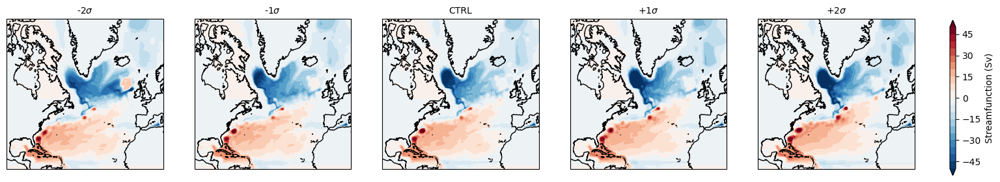

In [27]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
x_min_subpolar, x_max_subpolar = -70, -8
y_min_subpolar, y_max_subpolar = 40, 67

for i, expt_name in enumerate(dir_names):
    vmo_2d = cc.querying.getvar(expt[i], 'vmo_2d', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice('2081-01-01', end_time))
    vmo_2d = vmo_2d.sel(xh = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))
    Ψ = vmo_2d.cumsum('xh')/(1e6 * 1035)
    Ψ = Ψ.mean('time')
    file_path = '/g/data/x77/db6174/Project_3/North-Atlantic-Oscillation-tests/Repeat-year-forcing-setup/Masks/Subpolar-streamfunctions/Post/' + str(i) + '.txt'
    
    with open(file_path, 'r') as file:
        lines = file.readlines()
        matrix = np.array([list(map(int, line.split())) for line in lines])
    
    mask_Ψ = xr.DataArray(matrix, coords = [Ψ.sel(yq = slice(y_min_subpolar, y_max_subpolar)).yq, Ψ.sel(xh = slice(x_min_subpolar, x_max_subpolar)).xh], dims = ['yq','xh'], name = 'mask', attrs = {'units':'none'})
    axes[i].contour(mask_Ψ.xh, mask_Ψ.yq, mask_Ψ, levels = [1], cmap = 'Greys', transform = ccrs.PlateCarree(), extend = 'both')
    
    p1 = axes[i].contourf(Ψ.xh, Ψ.yq, Ψ, levels = np.linspace(-50, 50, 21), 
                     cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Streamfunction (Sv)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

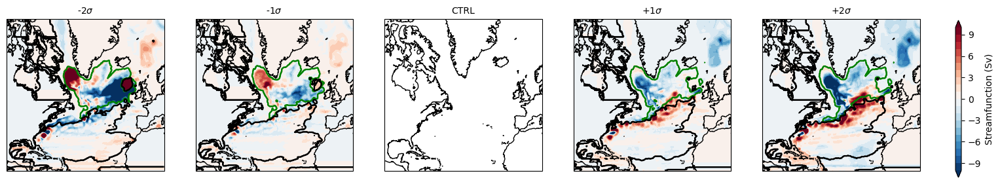

In [18]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
x_min_subpolar, x_max_subpolar = -70, -8
y_min_subpolar, y_max_subpolar = 40, 67

vmo_2d = cc.querying.getvar(expt[2], 'vmo_2d', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice('2081-01-01', end_time))
vmo_2d = vmo_2d.sel(xh = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))
Ψ = vmo_2d.cumsum('xh')/(1e6 * 1035)
Ψ_CTRL = Ψ.mean('time').load()

for i, expt_name in enumerate(dir_names):
    if(i == 2):
        continue
    vmo_2d = cc.querying.getvar(expt[i], 'vmo_2d', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice('2081-01-01', end_time))
    vmo_2d = vmo_2d.sel(xh = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))
    Ψ = vmo_2d.cumsum('xh')/(1e6 * 1035)
    Ψ = Ψ.mean('time')
    file_path = '/g/data/x77/db6174/Project_3/North-Atlantic-Oscillation-tests/Repeat-year-forcing-setup/Masks/Subpolar-streamfunctions/Post/' + str(i) + '.txt'
    
    with open(file_path, 'r') as file:
        lines = file.readlines()
        matrix = np.array([list(map(int, line.split())) for line in lines])
    
    mask_subpolar = xr.DataArray(matrix, coords = [Ψ.sel(yq = slice(y_min_subpolar, y_max_subpolar)).yq, Ψ.sel(xh = slice(x_min_subpolar, x_max_subpolar)).xh], dims = ['yq','xh'], name = 'mask', attrs = {'units':'none'})
    mask_subtropics = xr.where(Ψ > 0, 1, 0)
    
    p1 = axes[i].contourf(Ψ.xh, Ψ.yq, Ψ - Ψ_CTRL, levels = np.linspace(-10, 10, 21), 
                     cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')
    axes[i].contour(mask_Ψ.xh, mask_Ψ.yq, mask_subpolar, levels = 1, colors = 'green', transform = ccrs.PlateCarree(), lw = 2, linestyles = '-')
    axes[i].contour(mask_subtropics.xh, mask_subtropics.yq, mask_subtropics, levels = 1, colors = 'black', transform = ccrs.PlateCarree(), lw = 2, linestyles = '-')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Streamfunction (Sv)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

### 2.2 Time series using percentile method for subtropical gyre

In [9]:
x_min_subpolar, x_max_subpolar = -65, -8
y_min_subpolar, y_max_subpolar = 45, 67

### 2.3 Time series using percentile method for subpolar gyre

We directly take the subset defined by x_min2, x_max2, y_min2, and y_max2 since taking the whole region produces erroneous results.

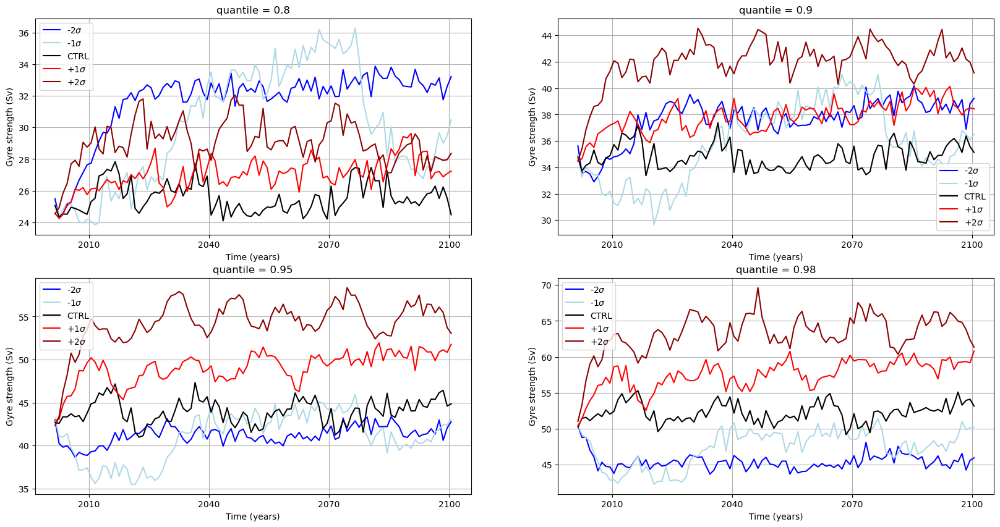

In [15]:
expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

areacello_cv = cc.querying.getvar(expt[2], 'areacello_cv', session, frequency = 'static', n = 1)
areacello_cv = areacello_cv.sel(xh = slice(x_min_subpolar, x_max_subpolar)).sel(yq = slice(y_min_subpolar, y_max_subpolar))
vmo_2d = cc.querying.getvar(expt[2], 'vmo_2d', session, frequency = '1 monthly', start_time = start_time, 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice(start_time, end_time))
areacello_cv = areacello_cv.where(~np.isnan(vmo_2d.isel(time = 0))).fillna(0)
areacello_cv_normalize = preprocessing.normalize(areacello_cv)
quan_vals = [0.2, 0.1, 0.05, 0.02]

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 10))
for i, expt_name in enumerate(dir_names):
    vmo_2d = cc.querying.getvar(expt[i], 'vmo_2d', session, frequency = '1 monthly', start_time = start_time, 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice(start_time, end_time))
    vmo_2d = vmo_2d.sel(xh = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))
    Ψ = vmo_2d.coarsen(time = 12).mean().cumsum('xh')/(1e6 * ρ0)
    Ψ = Ψ.sel(xh = slice(x_min_subpolar, x_max_subpolar)).sel(yq = slice(y_min_subpolar, y_max_subpolar))
    Ψ = Ψ.chunk(chunks = {'xh':-1, 'yq':-1})
    for j, quantile in enumerate(quan_vals):
        Ψ_ts = Ψ.weighted(areacello_cv).quantile(quantile, dim = {"yq", "xh"})
        (-1 * Ψ_ts).plot(label = expt_labels[i], color = color_values[i], ax = axes[int(j/2)][j%2])

for j in range(4):
    axes[int(j/2)][j%2].legend()
    axes[int(j/2)][j%2].grid()
    axes[int(j/2)][j%2].set_xlabel('Time (years)')
    axes[int(j/2)][j%2].set_ylabel('Gyre strength (Sv)')
    axes[int(j/2)][j%2].set_title('quantile = ' + str(1.0 - quan_vals[j]))

The subpolar gyre strength in the perturbation experiments can be individually summarised as follows:
1. Control seems pretty equilibrated, which is good.
2. Both the positive NAO phase experiments and the 2 standard deviation negative NAO phase experiment take around 15 years to reach a new state, after which they oscillate around the new state.
3. The 1 standard deviation negative NAO phase experiment doesn't seem to equilibrate well, and moves in between states.

## Stratification in Labrador (west) and Irminger (east) seas

In [10]:
x_min_irm, x_max_irm = -42, -27
y_min_irm, y_max_irm = 57, 64

x_min_lab, x_max_lab = -60, -45
y_min_lab, y_max_lab = 50, 65

x_min_east, x_max_east = -30, -10
y_min_east, y_max_east = 50, 60

In [11]:
def potrho_expt(expt_val, start_time_val, end_time_val):
    salt = cc.querying.getvar(expt_val, 'sos', session, frequency = '1 monthly', start_time = start_time_val, 
                            end_time = end_time_val, chunks = {}).sel(time = slice(start_time_val, end_time_val))
    salt = salt.coarsen(time = 12).mean()
    area = cc.querying.getvar(expt[2], 'areacello', session, frequency = 'static', n = 1)
    pressure = xr.DataArray(p_from_z(depth_tile, geolat), coords = [salt.yh, salt.xh], dims = ['yh', 'xh'], 
                        name = 'pressure', attrs = {'units':'dbar'})
    salt = xr.DataArray(SA_from_SP(salt, pressure, salt.xh, salt.yh), 
                        coords = [salt.time, salt.yh, salt.xh], dims = ['time', 'yh', 'xh'], 
                        name = 'sea surface salinity', attrs = {'units':'Absolute Salinity (g/kg)'})
    area = area * (salt[0]/salt[0])
    temp = cc.querying.getvar(expt_val, 'tos', session, frequency = '1 monthly', start_time = start_time_val, 
                            end_time = end_time_val, chunks = {}).sel(time = slice(start_time_val, end_time_val))
    temp = temp.coarsen(time = 12).mean()
    potrho_2 = xr.DataArray(rho(salt, temp, pressure), coords = [salt.time, salt.yh, salt.xh], 
                            dims = ['time',  'yh', 'xh'], name = 'potential density ref 2000dbar', 
                            attrs = {'units':'kg/m^3 (-2000 kg/m^3)'})
    return potrho_2, area

In [12]:
z_l = cc.querying.getvar(expt[2], 'z_l', session, n = 1)
geolat = cc.querying.getvar(expt[2], 'geolat', session, n = 1)
depth_tile = (geolat * 0 + 1) * -1 * z_l[0].values

Text(0.5, 1.0, 'East region')

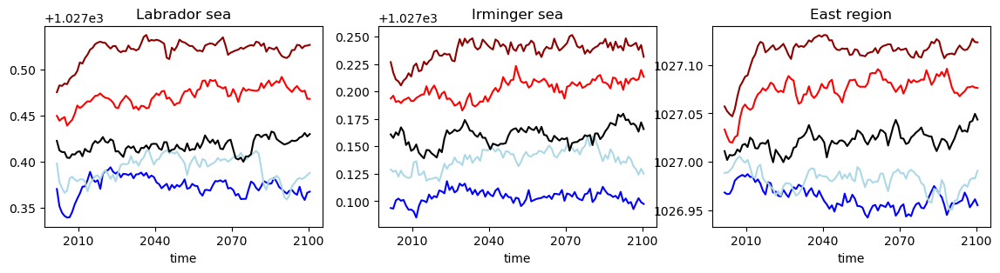

In [19]:
fig1, axes1 = plt.subplots(nrows = 1, ncols = 3, figsize = (14, 3))

for i, expt_name in enumerate(dir_names):
    
    potrho_2, area = potrho_expt(expt[i], start_time, end_time)
    potrho_2_irm = potrho_2.sel(xh = slice(x_min_irm, x_max_irm)).sel(yh = slice(y_min_irm, y_max_irm))
    potrho_2_lab = potrho_2.sel(xh = slice(x_min_lab, x_max_lab)).sel(yh = slice(y_min_lab, y_max_lab))
    potrho_2_east = potrho_2.sel(xh = slice(x_min_east, x_max_east)).sel(yh = slice(y_min_east, y_max_east))

    area_irm = area.sel(xh = slice(x_min_irm, x_max_irm)).sel(yh = slice(y_min_irm, y_max_irm))
    area_lab = area.sel(xh = slice(x_min_lab, x_max_lab)).sel(yh = slice(y_min_lab, y_max_lab))
    area_east = area.sel(xh = slice(x_min_east, x_max_east)).sel(yh = slice(y_min_east, y_max_east))

    strat_irm = ((potrho_2_irm * area_irm).sum(['xh', 'yh']))/(area_irm.sum(['xh', 'yh']))
    strat_lab = ((potrho_2_lab * area_lab).sum(['xh', 'yh']))/(area_lab.sum(['xh', 'yh']))
    strat_east = ((potrho_2_east * area_east).sum(['xh', 'yh']))/(area_east.sum(['xh', 'yh']))

    strat_irm.plot(ax = axes1[0], color = color_values[i])
    strat_lab.plot(ax = axes1[1], color = color_values[i])
    strat_east.plot(ax = axes1[2], color = color_values[i])

axes1[0].set_title('Labrador sea')
axes1[1].set_title('Irminger sea')
axes1[2].set_title('East region')

Text(0, 0.5, 'Salinity anomaly (psu)')

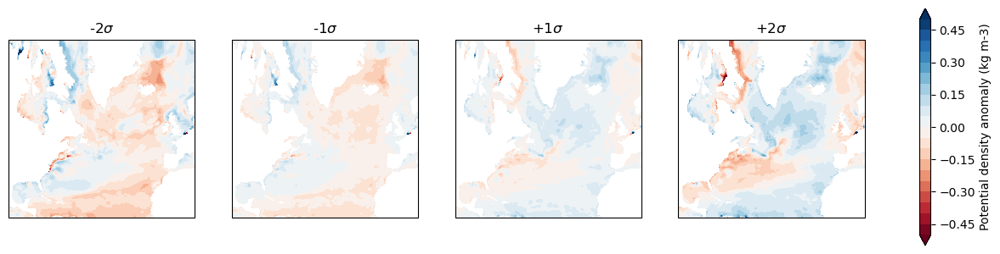

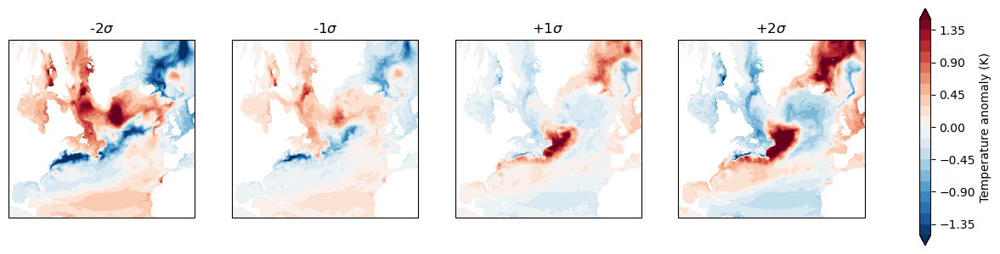

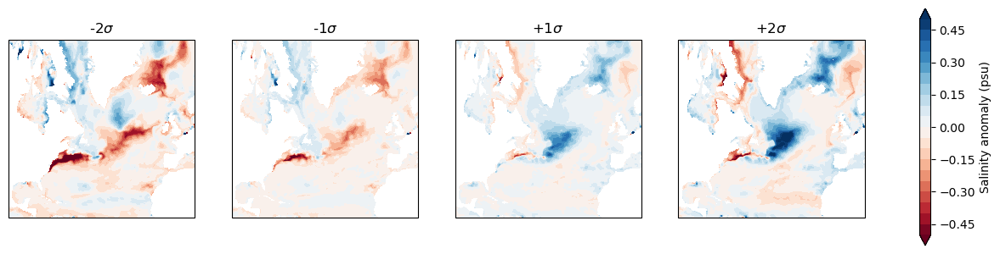

In [23]:
potrho_2_CTRL, area = potrho_expt(expt[2], '2081-01-01', end_time)

projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)

fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    potrho_2, area = potrho_expt(expt[i], '2081-01-01', end_time)
    potrho_2_anomaly = (potrho_2 - potrho_2_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(potrho_2_anomaly.xh, potrho_2_anomaly.yh, potrho_2_anomaly, levels = np.linspace(-0.5, 0.5, 21), 
                           cmap = 'RdBu', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Potential density anomaly (kg m-3)', fontsize = 10)


fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

SST_CTRL = cc.querying.getvar(expt[2], 'tos', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).sel(time = slice('2081-01-01', end_time))
j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    SST = cc.querying.getvar(expt[i], 'tos', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).sel(time = slice('2081-01-01', end_time))
    SST_anomaly = (SST - SST_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(SST_anomaly.xh, SST_anomaly.yh, SST_anomaly, levels = np.linspace(-1.5, 1.5, 21), 
                           cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Temperature anomaly (K)', fontsize = 10)


fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

SSS_CTRL = cc.querying.getvar(expt[2], 'sos', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).sel(time = slice('2081-01-01', end_time))
j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    SSS = cc.querying.getvar(expt[i], 'sos', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).sel(time = slice('2081-01-01', end_time))
    SSS_anomaly = (SSS - SSS_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(SSS_anomaly.xh, SSS_anomaly.yh, SSS_anomaly, levels = np.linspace(-0.5, 0.5, 21), 
                           cmap = 'RdBu', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Salinity anomaly (psu)', fontsize = 10)

Text(0, 0.5, 'Salinity anomaly (psu)')

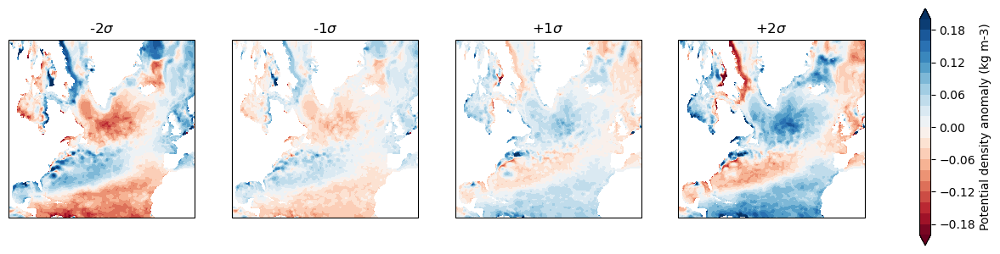

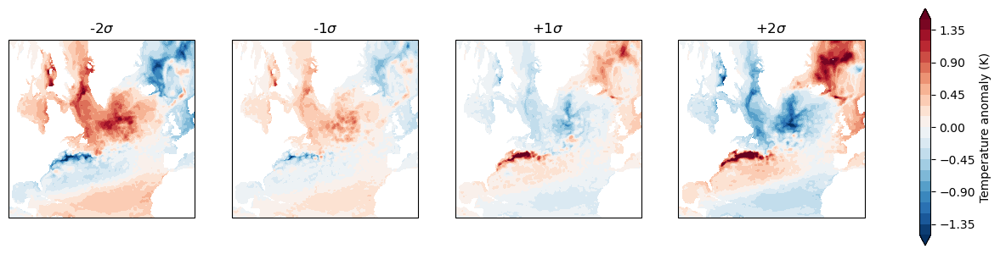

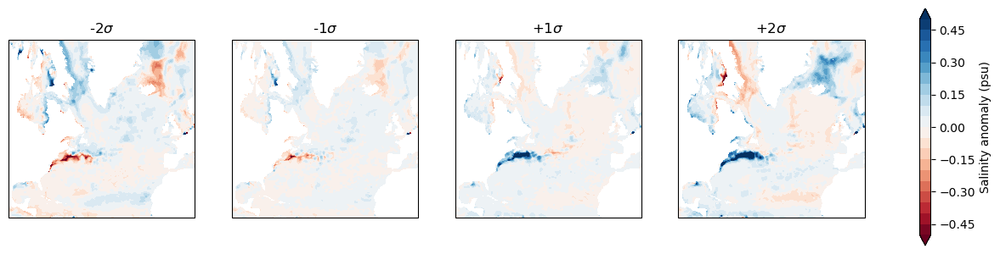

In [19]:
potrho_2_CTRL, area = potrho_expt(expt[2], '2001-01-01', '2005-12-31')

projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)

fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    potrho_2, area = potrho_expt(expt[i], '2001-01-01', '2005-12-31')
    potrho_2_anomaly = (potrho_2 - potrho_2_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(potrho_2_anomaly.xh, potrho_2_anomaly.yh, potrho_2_anomaly, levels = np.linspace(-0.2, 0.2, 21), 
                           cmap = 'RdBu', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Potential density anomaly (kg m-3)', fontsize = 10)


fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

SST_CTRL = cc.querying.getvar(expt[2], 'tos', session, frequency = '1 monthly', start_time = '2001-01-01', 
                            end_time = '2005-12-31', chunks = {}).sel(time = slice('2001-01-01', '2005-12-31'))
j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    SST = cc.querying.getvar(expt[i], 'tos', session, frequency = '1 monthly', start_time = '2001-01-01', 
                            end_time = '2005-12-31', chunks = {}).sel(time = slice('2001-01-01', '2005-12-31'))
    SST_anomaly = (SST - SST_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(SST_anomaly.xh, SST_anomaly.yh, SST_anomaly, levels = np.linspace(-1.5, 1.5, 21), 
                           cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Temperature anomaly (K)', fontsize = 10)


fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

SSS_CTRL = cc.querying.getvar(expt[2], 'sos', session, frequency = '1 monthly', start_time = '2001-01-01', 
                            end_time = '2005-12-31', chunks = {}).sel(time = slice('2001-01-01', '2005-12-31'))
j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    SSS = cc.querying.getvar(expt[i], 'sos', session, frequency = '1 monthly', start_time = '2001-01-01', 
                            end_time = '2005-12-31', chunks = {}).sel(time = slice('2001-01-01', '2005-12-31'))
    SSS_anomaly = (SSS - SSS_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(SSS_anomaly.xh, SSS_anomaly.yh, SSS_anomaly, levels = np.linspace(-0.5, 0.5, 21), 
                           cmap = 'RdBu', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Salinity anomaly (psu)', fontsize = 10)

Text(0, 0.5, 'Salinity anomaly (psu)')

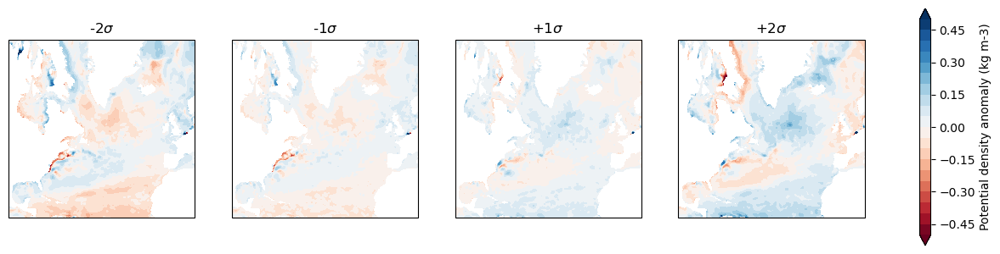

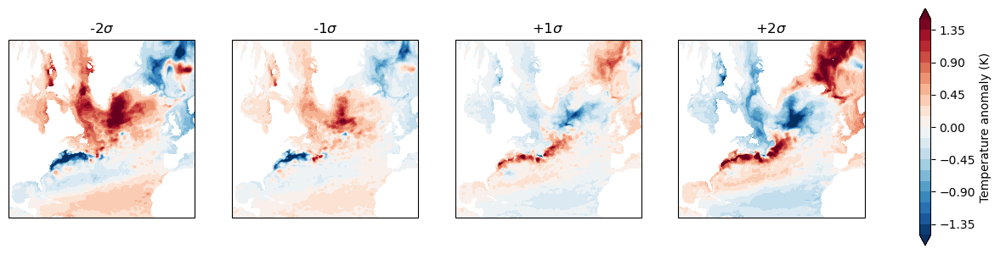

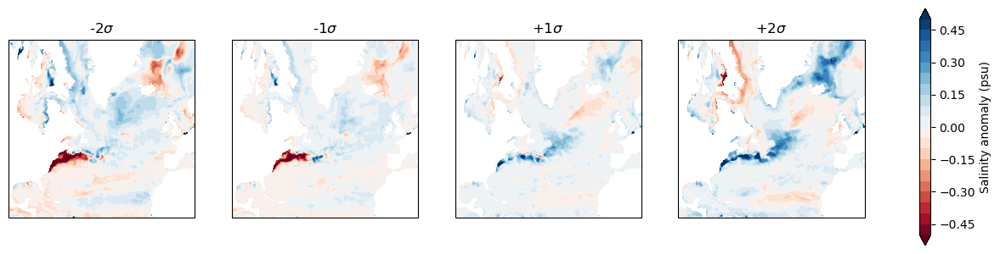

In [18]:
potrho_2_CTRL, area = potrho_expt(expt[2], '2006-01-01', '2010-12-31')

projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)

fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    potrho_2, area = potrho_expt(expt[i], '2006-01-01', '2010-12-31')
    potrho_2_anomaly = (potrho_2 - potrho_2_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(potrho_2_anomaly.xh, potrho_2_anomaly.yh, potrho_2_anomaly, levels = np.linspace(-0.5, 0.5, 21), 
                           cmap = 'RdBu', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Potential density anomaly (kg m-3)', fontsize = 10)


fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

SST_CTRL = cc.querying.getvar(expt[2], 'tos', session, frequency = '1 monthly', start_time = '2006-01-01', 
                            end_time = '2010-12-31', chunks = {}).sel(time = slice('2006-01-01', '2010-12-31'))
j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    SST = cc.querying.getvar(expt[i], 'tos', session, frequency = '1 monthly', start_time = '2006-01-01', 
                            end_time = '2010-12-31', chunks = {}).sel(time = slice('2006-01-01', '2010-12-31'))
    SST_anomaly = (SST - SST_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(SST_anomaly.xh, SST_anomaly.yh, SST_anomaly, levels = np.linspace(-1.5, 1.5, 21), 
                           cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Temperature anomaly (K)', fontsize = 10)


fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (13, 4), subplot_kw = {'projection': projection})

SSS_CTRL = cc.querying.getvar(expt[2], 'sos', session, frequency = '1 monthly', start_time = '2006-01-01', 
                            end_time = '2010-12-31', chunks = {}).sel(time = slice('2006-01-01', '2010-12-31'))
j = -1
for i, expt_name in enumerate(dir_names):
    j = j + 1
    if(i == 2):
        j = j - 1
        continue
    SSS = cc.querying.getvar(expt[i], 'sos', session, frequency = '1 monthly', start_time = '2006-01-01', 
                            end_time = '2010-12-31', chunks = {}).sel(time = slice('2006-01-01', '2010-12-31'))
    SSS_anomaly = (SSS - SSS_CTRL).sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[j].contourf(SSS_anomaly.xh, SSS_anomaly.yh, SSS_anomaly, levels = np.linspace(-0.5, 0.5, 21), 
                           cmap = 'RdBu', transform = ccrs.PlateCarree(), extend = 'both')
    axes[j].set_title(expt_labels[i])

cax = plt.axes([0.95, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Salinity anomaly (psu)', fontsize = 10)

## Mixed layer depths

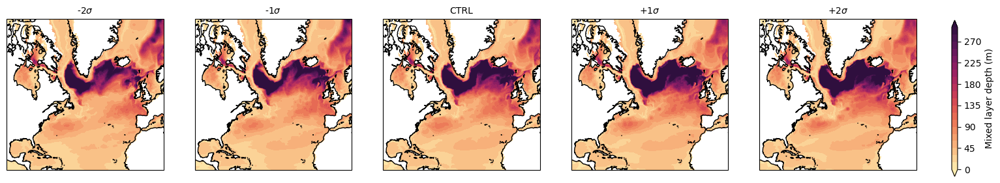

In [13]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']

for i, expt_name in enumerate(dir_names):
    mld = cc.querying.getvar(expt[i], 'mlotst', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).sel(time = slice('2081-01-01', end_time))
    mld = mld.sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[i].contourf(mld.xh, mld.yh, mld, levels = np.linspace(0, 300, 21), 
                     cmap = cm.cm.matter, transform = ccrs.PlateCarree(), extend = 'both')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Mixed layer depth (m)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

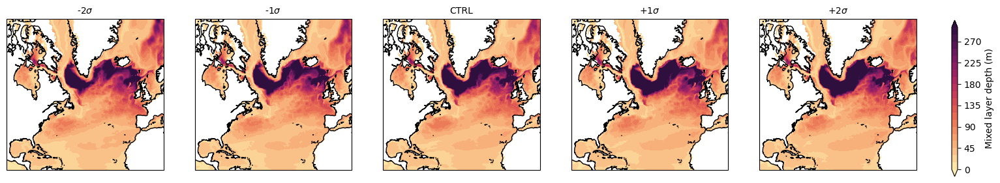

In [14]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']

for i, expt_name in enumerate(dir_names):
    mld = cc.querying.getvar(expt[i], 'mlotst', session, frequency = '1 monthly', start_time = '2001-01-01', 
                            end_time = '2005-12-31', chunks = {}).sel(time = slice('2001-01-01', '2005-12-31'))
    mld = mld.sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[i].contourf(mld.xh, mld.yh, mld, levels = np.linspace(0, 300, 21), 
                     cmap = cm.cm.matter, transform = ccrs.PlateCarree(), extend = 'both')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Mixed layer depth (m)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

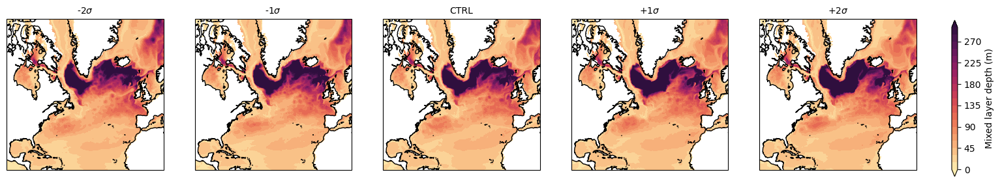

In [15]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']

for i, expt_name in enumerate(dir_names):
    mld = cc.querying.getvar(expt[i], 'mlotst', session, frequency = '1 monthly', start_time = '2006-01-01', 
                            end_time = '2010-12-31', chunks = {}).sel(time = slice('2006-01-01', '2010-12-31'))
    mld = mld.sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[i].contourf(mld.xh, mld.yh, mld, levels = np.linspace(0, 300, 21), 
                     cmap = cm.cm.matter, transform = ccrs.PlateCarree(), extend = 'both')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Mixed layer depth (m)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

## How does net surface heating look like in each case?

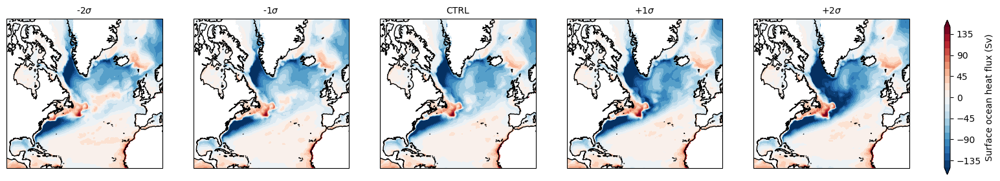

In [11]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']

for i, expt_name in enumerate(dir_names):
    hfds = cc.querying.getvar(expt[i], 'hfds', session, frequency = '1 monthly', start_time = '2081-01-01', 
                            end_time = end_time, chunks = {}).sel(time = slice('2081-01-01', end_time))
    hfds = hfds.sel(xh = slice(x_min, x_max)).sel(yh = slice(y_min, y_max)).mean('time')
    p1 = axes[i].contourf(hfds.xh, hfds.yh, hfds, levels = np.linspace(-150, 150, 21), 
                     cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Surface ocean heat flux (Sv)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

## Stratification in the Labrador sea

For simplicity, we just pick the centre of Labrador sea and compare its stratification across experiments for (i) all years, and (ii) only winter.

In [6]:
def potrho_expt_depth(expt_val, start_time_val, end_time_val):
    salt = cc.querying.getvar(expt_val, 'so', session, frequency = '1 monthly', start_time = start_time_val, 
                            end_time = end_time_val, chunks = {}).sel(time = slice(start_time_val, end_time_val))
    salt = salt.coarsen(time = 12).mean()
    area = cc.querying.getvar(expt[2], 'areacello', session, frequency = 'static', n = 1)
    pressure = xr.DataArray(p_from_z(depth_tile, geolat), coords = [salt.yh, salt.xh], dims = ['yh', 'xh'], 
                        name = 'pressure', attrs = {'units':'dbar'})
    salt = xr.DataArray(SA_from_SP(salt, pressure, salt.xh, salt.yh), 
                        coords = [salt.time, salt.z_l, salt.yh, salt.xh], dims = ['time', 'z_l', 'yh', 'xh'], 
                        name = 'sea surface salinity', attrs = {'units':'Absolute Salinity (g/kg)'})
    area = area * (salt[0]/salt[0])
    temp = cc.querying.getvar(expt_val, 'thetao', session, frequency = '1 monthly', start_time = start_time_val, 
                            end_time = end_time_val, chunks = {}).sel(time = slice(start_time_val, end_time_val))
    temp = temp.coarsen(time = 12).mean()
    potrho_2 = xr.DataArray(rho(salt, temp, pressure), coords = [salt.time, salt.z_l, salt.yh, salt.xh], 
                            dims = ['time', 'z_l', 'yh', 'xh'], name = 'potential density ref 2000dbar', 
                            attrs = {'units':'kg/m^3 (-2000 kg/m^3)'})
    return potrho_2, area

In [7]:
def potrho_expt_depth_DJF(expt_val, start_time_val, end_time_val):
    salt = cc.querying.getvar(expt_val, 'so', session, frequency = '1 monthly', start_time = start_time_val, 
                            end_time = end_time_val, chunks = {}).sel(time = slice(start_time_val, end_time_val))
    salt = salt.where(salt.time.dt.month.isin([12, 1, 2]), drop = True)
    salt = salt.coarsen(time = 3).mean()
    area = cc.querying.getvar(expt[2], 'areacello', session, frequency = 'static', n = 1)
    pressure = xr.DataArray(p_from_z(depth_tile, geolat), coords = [salt.yh, salt.xh], dims = ['yh', 'xh'], 
                        name = 'pressure', attrs = {'units':'dbar'})
    salt = xr.DataArray(SA_from_SP(salt, pressure, salt.xh, salt.yh), 
                        coords = [salt.time, salt.z_l, salt.yh, salt.xh], dims = ['time', 'z_l', 'yh', 'xh'], 
                        name = 'sea surface salinity', attrs = {'units':'Absolute Salinity (g/kg)'})
    area = area * (salt[0]/salt[0])
    temp = cc.querying.getvar(expt_val, 'thetao', session, frequency = '1 monthly', start_time = start_time_val, 
                            end_time = end_time_val, chunks = {}).sel(time = slice(start_time_val, end_time_val))
    temp = temp.where(temp.time.dt.month.isin([12, 1, 2]), drop = True)
    temp = temp.coarsen(time = 3).mean()
    potrho_2 = xr.DataArray(rho(salt, temp, pressure), coords = [salt.time, salt.z_l, salt.yh, salt.xh], 
                            dims = ['time', 'z_l', 'yh', 'xh'], name = 'potential density ref 2000dbar', 
                            attrs = {'units':'kg/m^3 (-2000 kg/m^3)'})
    return potrho_2, area

### Labrador sea

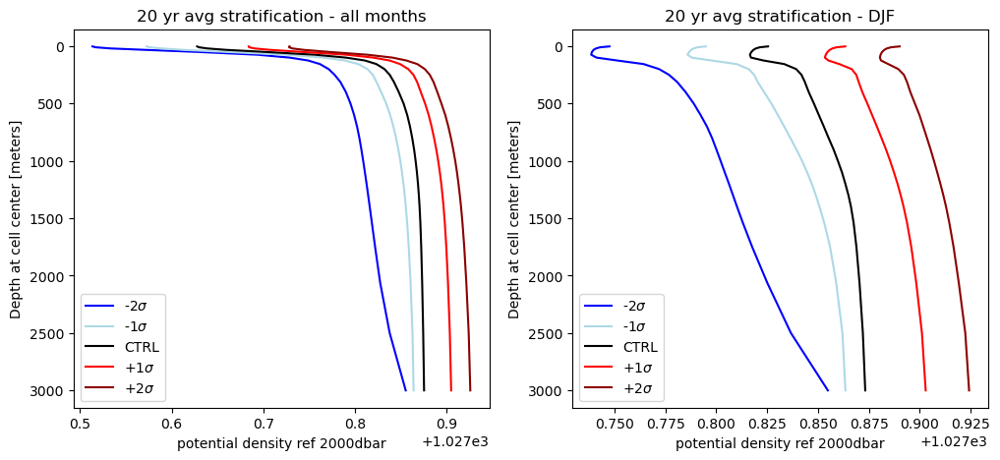

In [12]:
x_lab, y_lab = -55, 60

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 5))
for i, expt_name in enumerate(dir_names):
    
    potrho_2, area = potrho_expt_depth(expt[i], '2091-01-01', end_time)
    potrho_2_lab = potrho_2.sel(xh = x_lab, method = 'nearest').sel(yh = y_lab, method = 'nearest')
    potrho_2_lab = potrho_2_lab.mean('time')
    potrho_2_lab.plot(y = 'z_l', ax = axes[0], label = expt_labels[i], color = color_values[i])
    axes[0].invert_yaxis()
    axes[0].set_title('20 yr avg stratification - all months')
    axes[0].legend()

    potrho_2, area = potrho_expt_depth_DJF(expt[i], '2091-01-01', end_time)
    potrho_2_lab = potrho_2.sel(xh = x_lab, method = 'nearest').sel(yh = y_lab, method = 'nearest')
    potrho_2_lab = potrho_2_lab.mean('time')
    potrho_2_lab.plot(y = 'z_l', ax = axes[1], label = expt_labels[i], color = color_values[i])
    axes[1].invert_yaxis()
    axes[1].set_title('20 yr avg stratification - DJF')
    axes[1].legend()

### Eastern region (near Rockall rise)

This is another interesting result, it shows that the density stratification in the winter column in winter is important in determining the depth of convection activity in the Labrador sea.

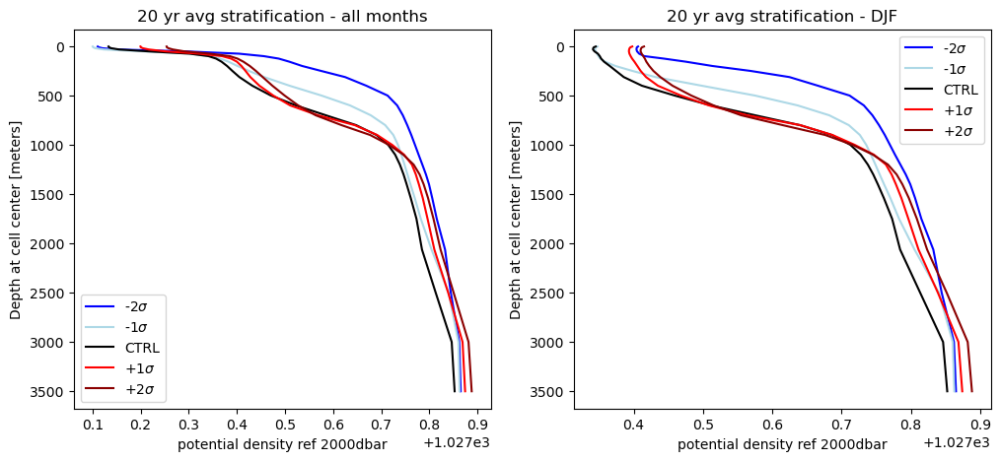

In [11]:
x_east, y_east = -25, 55

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 5))
for i, expt_name in enumerate(dir_names):
    
    potrho_2, area = potrho_expt_depth(expt[i], '2091-01-01', end_time)
    potrho_2_lab = potrho_2.sel(xh = x_east, method = 'nearest').sel(yh = y_east, method = 'nearest')
    potrho_2_lab = potrho_2_lab.mean('time')
    potrho_2_lab.plot(y = 'z_l', ax = axes[0], label = expt_labels[i], color = color_values[i])
    axes[0].invert_yaxis()
    axes[0].set_title('20 yr avg stratification - all months')
    axes[0].legend()

    potrho_2, area = potrho_expt_depth_DJF(expt[i], '2091-01-01', end_time)
    potrho_2_lab = potrho_2.sel(xh = x_east, method = 'nearest').sel(yh = y_east, method = 'nearest')
    potrho_2_lab = potrho_2_lab.mean('time')
    potrho_2_lab.plot(y = 'z_l', ax = axes[1], label = expt_labels[i], color = color_values[i])
    axes[1].invert_yaxis()
    axes[1].set_title('20 yr avg stratification - DJF')
    axes[1].legend()

## Wind stress curl

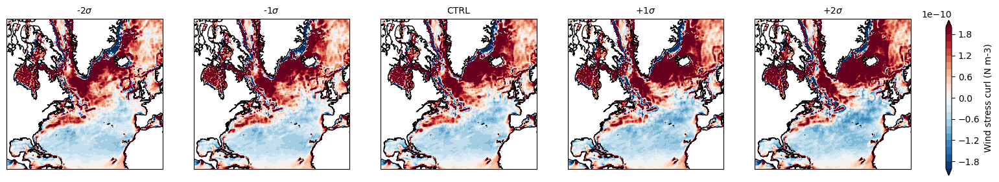

In [15]:
projection = ccrs.Mercator(central_longitude = (x_max + x_min)/2, min_latitude = y_min, max_latitude = y_max)
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (18, 4), subplot_kw = {'projection': projection})

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']

var_name = 'curl_taus'
for i, expt_name in enumerate(dir_names):
    var = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name]
    var = var.sel(xq = slice(x_min, x_max)).sel(yq = slice(y_min, y_max)).mean('time')
    p1 = axes[i].contourf(var.xq, var.yq, var, levels = np.linspace(-2e-10, 2e-10, 21),
                     cmap = 'RdBu_r', transform = ccrs.PlateCarree(), extend = 'both')

cax = plt.axes([0.93, 0.18, 0.005, 0.6])
cb = plt.colorbar(p1, cax = cax, orientation = 'vertical', ax = axes)
cb.ax.set_ylabel('Wind stress curl (N m-3)', fontsize = 10)

for i in range(5):
    axes[i].set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    axes[i].coastlines(resolution = '50m')
    axes[i].set_title(expt_labels[i], fontsize = 10)

## Bathymetry

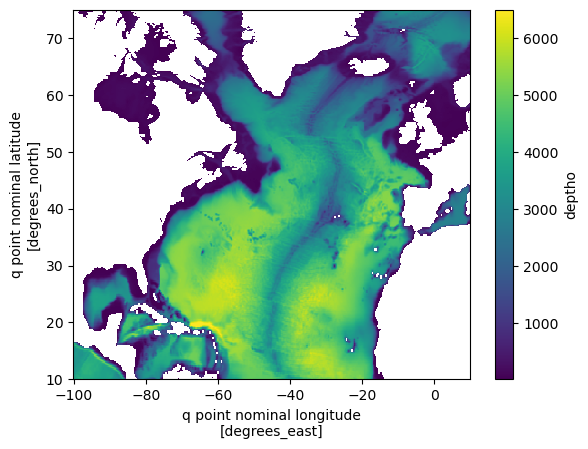

In [115]:
deptho = cc.querying.getvar(expt[2], 'deptho', session, frequency = 'static', n = 1)
deptho = grid.interp(deptho, 'X')
deptho = grid.interp(deptho, 'Y')
deptho = deptho.sel(xq = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))
deptho.plot()

## Vorticity time series based on streamfunction

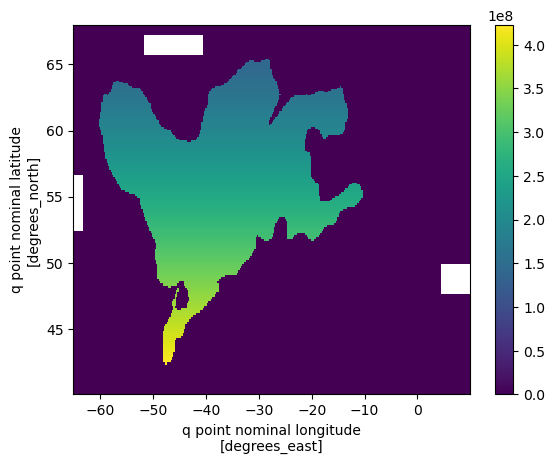

In [36]:
file_path = '/g/data/x77/db6174/Project_3/North-Atlantic-Oscillation-tests/Repeat-year-forcing-setup/subpolar-gyre-post.txt'

with open(file_path, 'r') as file:
    lines = file.readlines()
    matrix = np.array([list(map(int, line.split())) for line in lines])

areacello_bu_subset = cc.querying.getvar(expt[2], 'areacello_bu', session, frequency = 'static', n = 1).sel(xq = slice(-65, 10)).sel(yq = slice(40, 68))
new_mask = xr.DataArray(matrix, coords = [areacello_bu_subset.xq, areacello_bu_subset.yq], dims = ['xq','yq'], name = 'mask', attrs = {'units':'none'})
area_subpolar_updated = areacello_bu_subset * new_mask
area_subpolar_updated.plot()

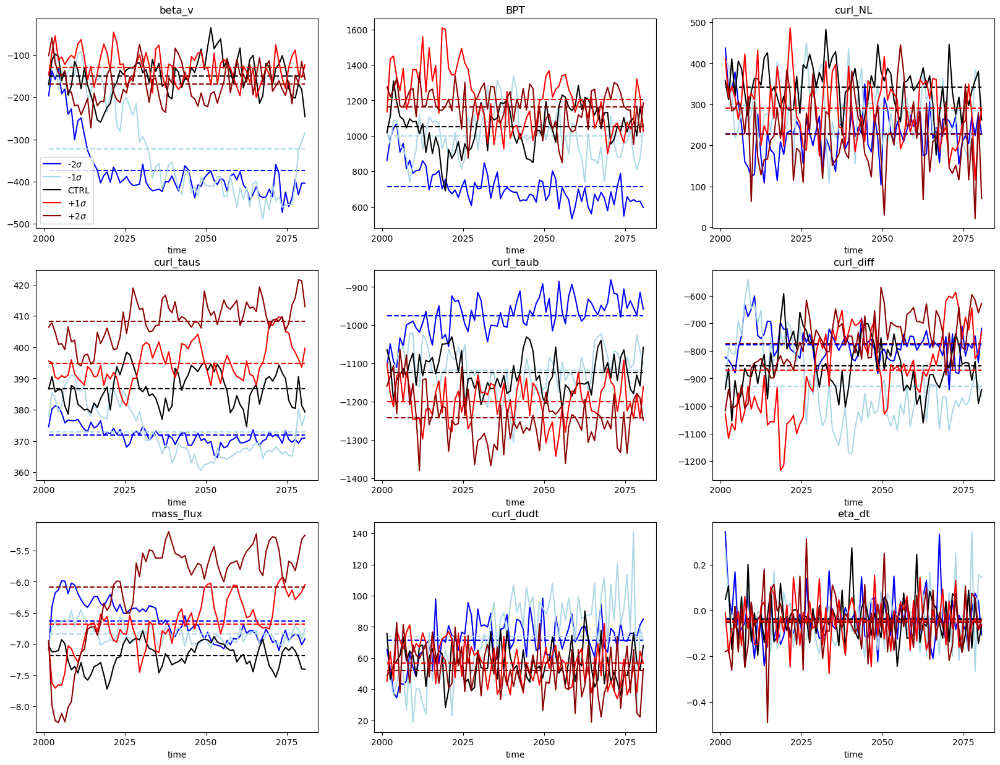

In [56]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name]
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name]
        var = xr.concat([var1, var2], dim = 'time')
        var = (var * area_subpolar_updated).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

## What about the east region only?

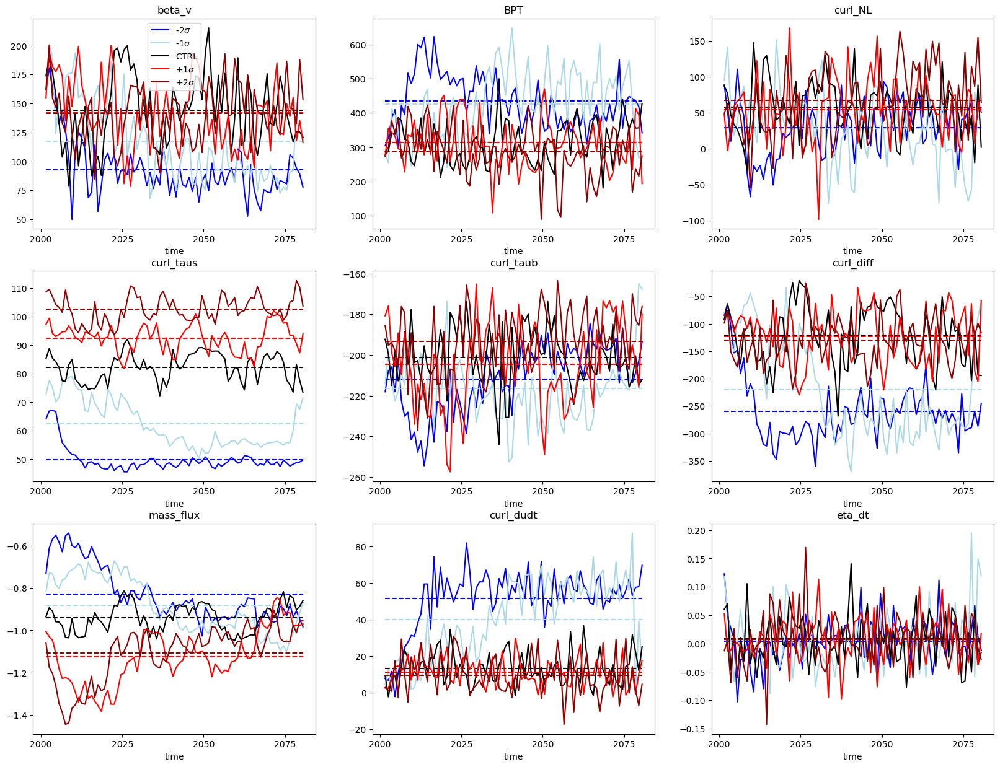

In [40]:
area_subpolar_east = area_subpolar_updated.sel(xq = slice(x_min_east, x_max_east))

fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name]
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name]
        var = xr.concat([var1, var2], dim = 'time')
        var = (var * area_subpolar_east).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

## Reproducing Corre et al 2020

In [6]:
umo_2d = cc.querying.getvar(expt[2], 'umo_2d', session, frequency = '1 monthly', start_time = start_time, 
                            end_time = end_time, chunks = {}).isel(xq = slice(1, None)).sel(time = slice(start_time, end_time))
vmo_2d = cc.querying.getvar(expt[2], 'vmo_2d', session, frequency = '1 monthly', start_time = start_time, 
                            end_time = end_time, chunks = {}).isel(yq = slice(1, None)).sel(time = slice(start_time, end_time))

grid_data = xr.merge((umo_2d, vmo_2d))
grid = xgcm.Grid(grid_data, coords={'X': {'center': 'xh', 'right': 'xq'}, 'Y': {'center': 'yh', 'right': 'yq'}}, periodic=['X'])
vmo_2d_itp = grid.interp(vmo_2d, 'X', boundary = 'fill')

area_bu = cc.querying.getvar(expt[2], 'areacello_bu', session, frequency = 'static', n = 1).isel(xq = slice(1, None)).isel(yq = slice(1, None))
#area_bu = area_bu * (vmo_2d_itp[0]/vmo_2d_itp[0])
area_bu_NA = area_bu.sel(xq = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))

In [7]:
geolon = cc.querying.getvar(expt[2], 'geolon', session, frequency = 'static', n = 1)
geolat = cc.querying.getvar(expt[2], 'geolat', session, frequency = 'static', n = 1)

In [8]:
# Define the levels for the contourf
lvls = np.linspace(-80, 80, 41)

def psi_func(axes):

    ## Cell-centred x-directed mass transport vertically summed
    tx_trans_int_z = umo_2d.mean('time')
    
    ## 2-dimensional lat-lon grid
    geolon_t = geolon
    geolat_t = geolat
    
    ## Calculation of streamfunction from x-directed mass transport
    psi = -tx_trans_int_z.cumsum('yh')/(1e6*ρ0) # divide by 1e6 to convert m^3/s -> Sv
    psi_acc = np.nanmin(psi.sel(xq = slice(-69, -67), yh = slice(-80, -55)))
    psi_g = psi - psi_acc
    psi_g = psi_g.rename('psi')
    psi_g.attrs['long_name'] = 'Barotropic Streamfunction'
    psi_g.attrs['units'] = 'Sv'
    psi_g = psi_g.where(~np.isnan(tx_trans_int_z))
    
    ## Interpolating streamfunction to cell centre grid
    paths = []
    paths.append("/g/data3/hh5/tmp/cosima/access-om2-025/025deg_jra55_ryf_spinup7_RCP45/output120/ocean/ocean.nc")
    data = xr.merge((psi_g, geolat_t))
    data.coords['xq'].attrs.update(axis='X')
    data.coords['xh'].attrs.update(axis='X',c_grid_axis_shift=0.5)
    g = xgcm.Grid(data, periodic=['X'])
    psi_g = g.interp(psi_g, 'X')
    psi_g = psi_g.rename('psi')
    
    ## Plotting begins
    
    ## Plotting land and continent boundaries
    axes.add_feature(cfeature.LAND, edgecolor = 'black', facecolor = 'gray', zorder = 2)
    axes.gridlines(color = 'grey', linestyle = '--')
    
    ## Plotting global streamfunction
    cf = axes.contourf(psi_g.xh.values, psi_g.yh.values, (psi_g * np.sign(psi.yh)).values, levels = lvls, cmap = cm.cm.balance, extend = 'both',
                 transform = ccrs.PlateCarree())
    
    ## Specifying colorbar attributes
    cbar = fig.colorbar(cf, ax = axes, orientation = 'vertical', shrink = 0.4, ticks = [-80, -40, 0, 40, 80], pad = 0.04)#, aspect = 25, fraction = 0.05)
    cbar.set_label('Transport (Sv)', fontsize = 8)
    cbar.ax.tick_params(labelsize = 8)
    
    return psi_g

Text(0.5, 1.0, '')

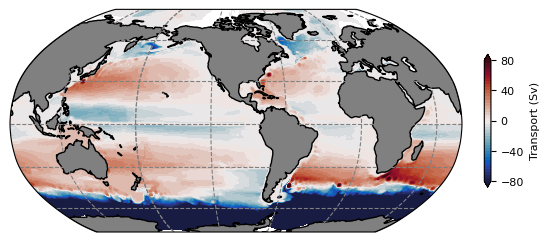

In [9]:
fig, ax1 = plt.subplots(figsize = (6*1.2, 3.6*1.2), subplot_kw = {'projection': ccrs.Robinson(central_longitude = 260)})
psi = psi_func(ax1)
ax1.set_title('')

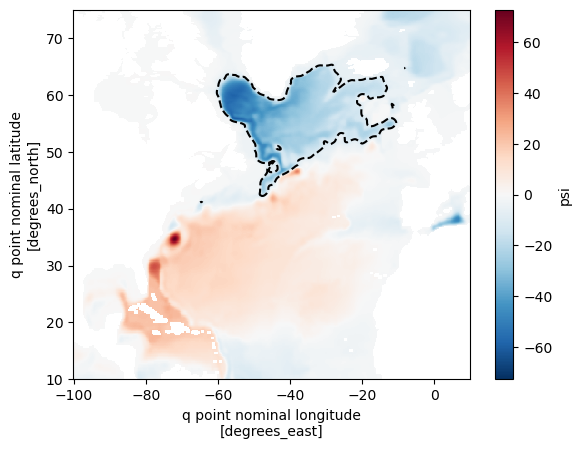

In [10]:
psi = grid.interp(psi, 'X')
psi = grid.interp(psi, 'Y')
psi_NA = psi.sel(xq = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))
psi_NA.load()

x_min_subpolar, x_max_subpolar = -65, -8
y_min_subpolar, y_max_subpolar = 41, 67

flow_cutoff  = 10 # Sv
psi_NA_subpolar = psi_NA.sel(xq = slice(x_min_subpolar, x_max_subpolar)).sel(yq = slice(y_min_subpolar, y_max_subpolar))
psi_NA.plot()
psi_NA_subpolar.plot.contour(levels = np.linspace(-flow_cutoff, -(flow_cutoff + 0.001), 1), cmap = 'black')

### Depth case 1: Depth_cutoff = 3000

In [11]:
depth_cutoff = 3000 # metres
deptho = cc.querying.getvar(expt[2], 'deptho', session, frequency = 'static', n = 1)
deptho = grid.interp(deptho, 'X')
deptho = grid.interp(deptho, 'Y')
depth_subpolar = deptho.sel(xq = slice(x_min_subpolar, x_max_subpolar)).sel(yq = slice(y_min_subpolar, y_max_subpolar))
psi_NA_shallow_gyre = xr.where(depth_subpolar <= depth_cutoff, psi_NA_subpolar, 0)
psi_NA_deep_gyre = xr.where(depth_subpolar > depth_cutoff, psi_NA_subpolar, 0)

Text(0.5, 1.0, 'Depth mask')

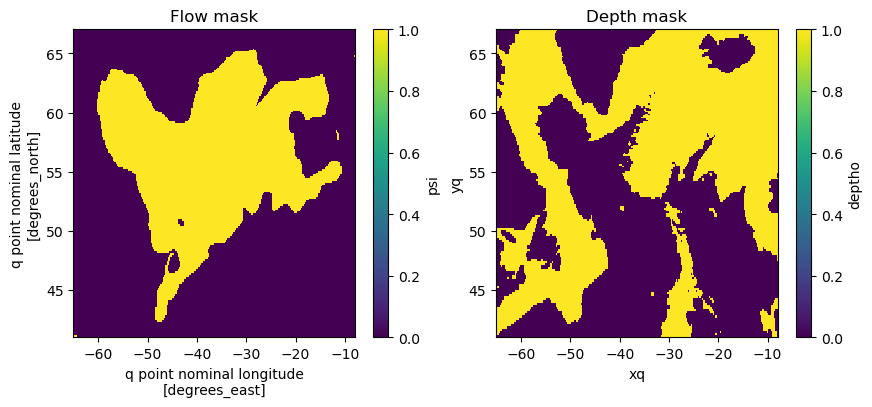

In [12]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))

flow_mask = xr.where(psi_NA_subpolar <= -flow_cutoff, 1, 0)
deep_mask = xr.where(depth_subpolar >=depth_cutoff, 1, 0)
shallow_mask = xr.where(depth_subpolar <depth_cutoff, 1, 0)

flow_mask.plot(ax = axes[0])
shallow_mask.plot(ax = axes[1])

axes[0].set_title('Flow mask')
axes[1].set_title('Depth mask')

Text(0.5, 1.0, 'Interior subpolar gyre')

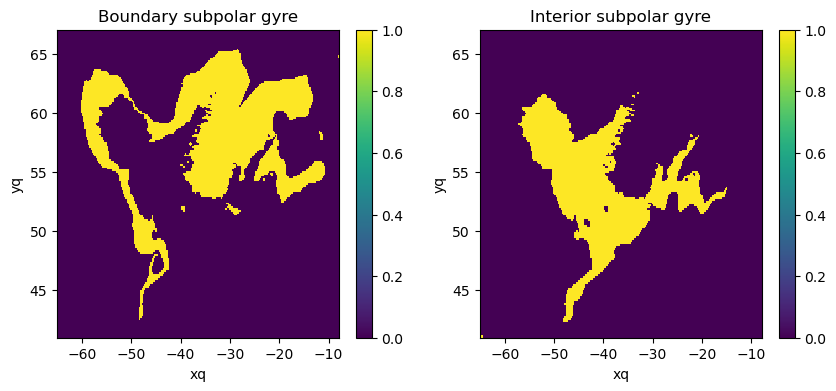

In [13]:
interior_subpolar = xr.where(deep_mask + flow_mask == 2, 1, 0)
boundary_subpolar = xr.where(shallow_mask + flow_mask == 2, 1, 0)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
boundary_subpolar.plot(ax = axes[0])
interior_subpolar.plot(ax = axes[1])

axes[0].set_title('Boundary subpolar gyre')
axes[1].set_title('Interior subpolar gyre')

### Vorticity dynamics for interior vs on the boundary of the gyre

This also aligns with the fact that the western part of the subpolar gyre behaves differently than the eastern part.

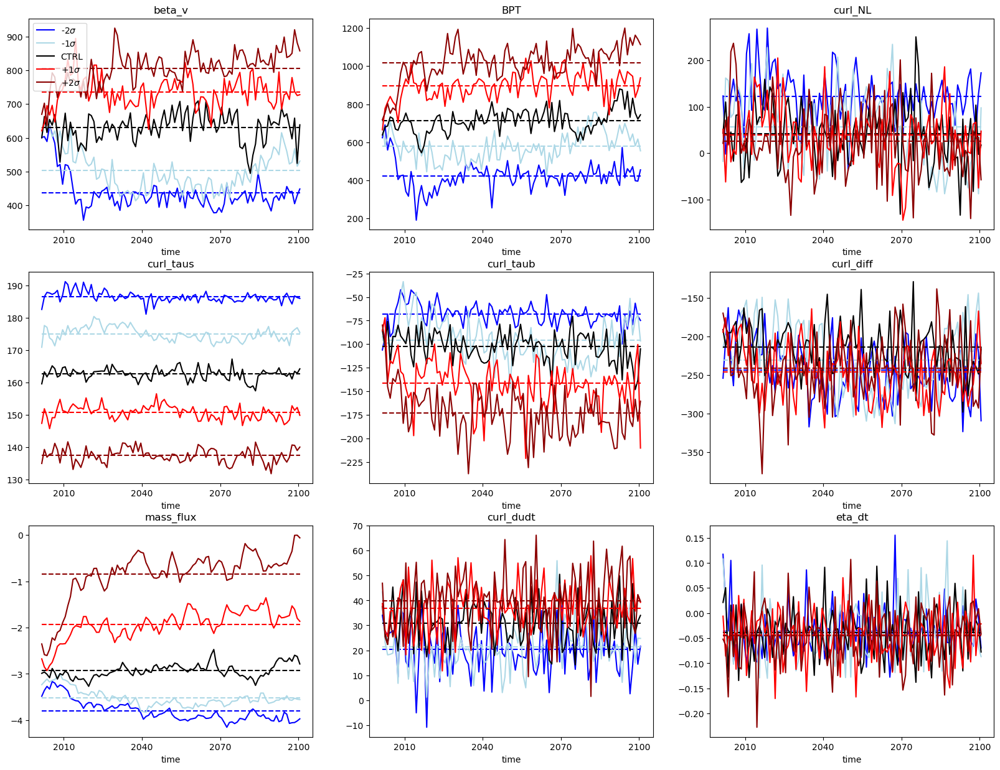

In [14]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name].astype(np.float32)
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name].astype(np.float32)
        var3 = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name].astype(np.float32)
        var = xr.concat([var1, var2, var3], dim = 'time')
        var = (var * area_bu_NA * interior_subpolar).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

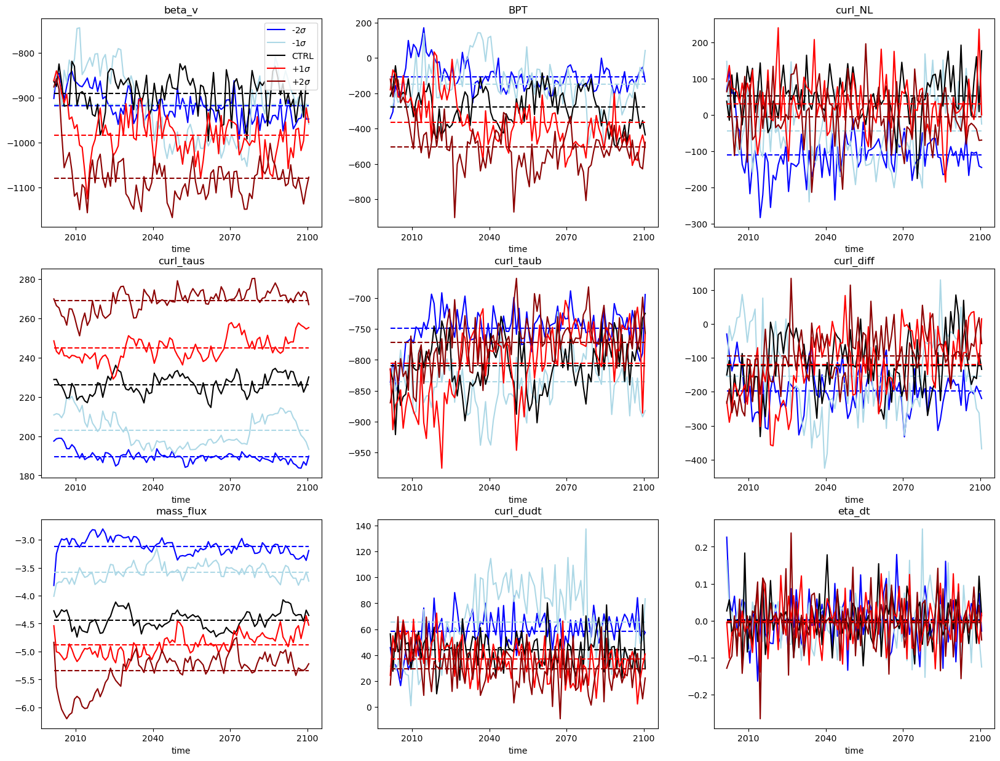

In [15]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name].astype(np.float32)
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name].astype(np.float32)
        var3 = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name].astype(np.float32)
        var = xr.concat([var1, var2, var3], dim = 'time')
        var = (var * area_bu_NA * boundary_subpolar).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

### Depth case 2: Depth_cutoff = 2000

In [17]:
depth_cutoff = 2000 # metres
deptho = cc.querying.getvar(expt[2], 'deptho', session, frequency = 'static', n = 1)
deptho = grid.interp(deptho, 'X')
deptho = grid.interp(deptho, 'Y')
depth_subpolar = deptho.sel(xq = slice(x_min_subpolar, x_max_subpolar)).sel(yq = slice(y_min_subpolar, y_max_subpolar))
psi_NA_shallow_gyre = xr.where(depth_subpolar <= depth_cutoff, psi_NA_subpolar, 0)
psi_NA_deep_gyre = xr.where(depth_subpolar > depth_cutoff, psi_NA_subpolar, 0)

Text(0.5, 1.0, 'Depth mask')

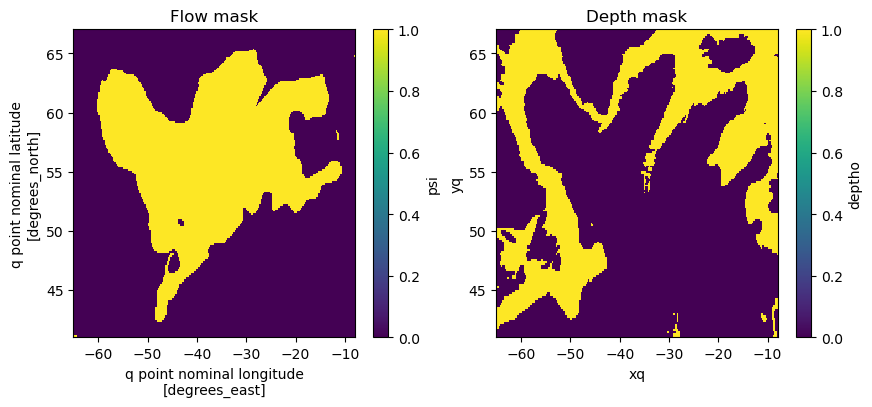

In [18]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))

flow_mask = xr.where(psi_NA_subpolar <= -flow_cutoff, 1, 0)
deep_mask = xr.where(depth_subpolar >=depth_cutoff, 1, 0)
shallow_mask = xr.where(depth_subpolar <depth_cutoff, 1, 0)

flow_mask.plot(ax = axes[0])
shallow_mask.plot(ax = axes[1])

axes[0].set_title('Flow mask')
axes[1].set_title('Depth mask')

Text(0.5, 1.0, 'Interior subpolar gyre')

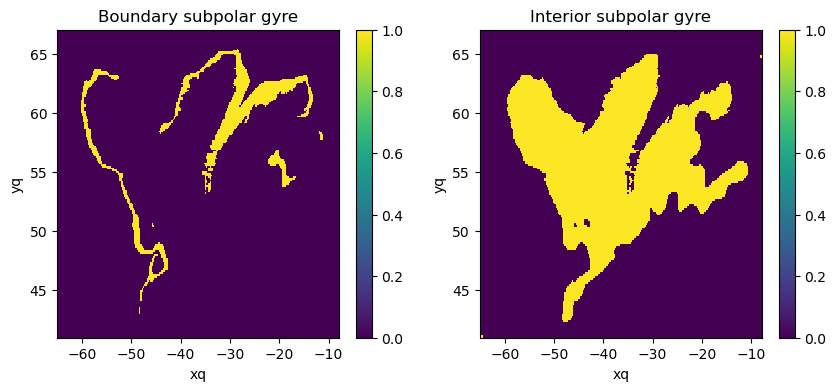

In [19]:
interior_subpolar = xr.where(deep_mask + flow_mask == 2, 1, 0)
boundary_subpolar = xr.where(shallow_mask + flow_mask == 2, 1, 0)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
boundary_subpolar.plot(ax = axes[0])
interior_subpolar.plot(ax = axes[1])

axes[0].set_title('Boundary subpolar gyre')
axes[1].set_title('Interior subpolar gyre')

### Vorticity dynamics for interior vs on the boundary of the gyre

This also aligns with the fact that the western part of the subpolar gyre behaves differently than the eastern part.

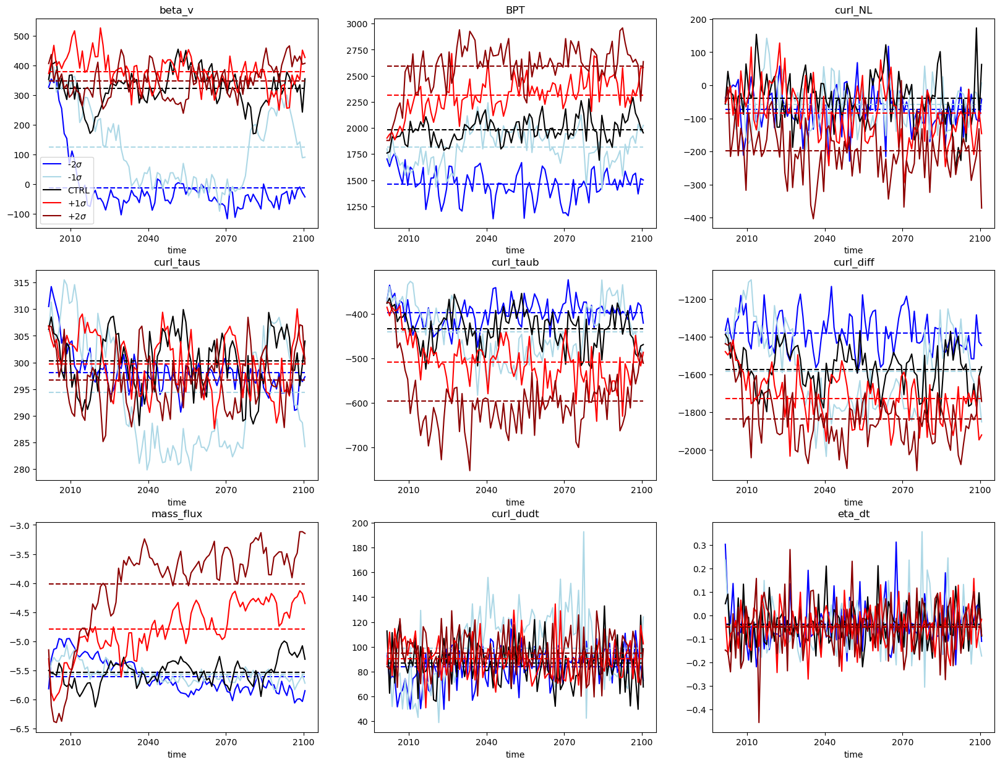

In [20]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name].astype(np.float32)
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name].astype(np.float32)
        var3 = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name].astype(np.float32)
        var = xr.concat([var1, var2, var3], dim = 'time')
        var = (var * area_bu_NA * interior_subpolar).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

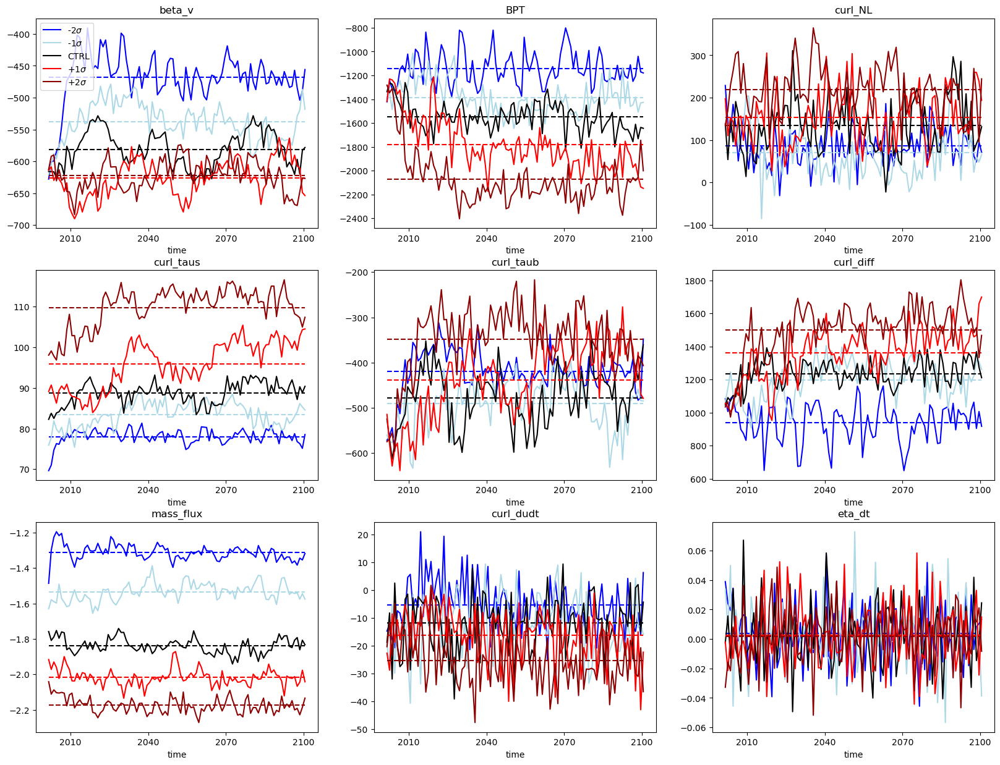

In [21]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name].astype(np.float32)
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name].astype(np.float32)
        var3 = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name].astype(np.float32)
        var = xr.concat([var1, var2, var3], dim = 'time')
        var = (var * area_bu_NA * boundary_subpolar).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

### SSH case 1: 1 m depth

In [11]:
SSH_CTRL = cc.querying.getvar(expt[2], 'zos', session, frequency = '1 monthly', start_time = start_time, 
                            end_time = end_time, chunks = {}).sel(time = slice(start_time, end_time))
SSH_CTRL = grid.interp(SSH_CTRL, 'Y', boundary = 'fill')
SSH_CTRL = grid.interp(SSH_CTRL, 'X', boundary = 'fill')
SSH_CTRL = SSH_CTRL.sel(xq = slice(x_min, x_max)).sel(yq = slice(y_min, y_max))

In [12]:
SSH_subpolar = SSH_CTRL.sel(xq = slice(x_min_subpolar, x_max_subpolar)).sel(yq = slice(y_min_subpolar, y_max_subpolar)).mean('time')

Text(0.5, 1.0, 'SSH mask')

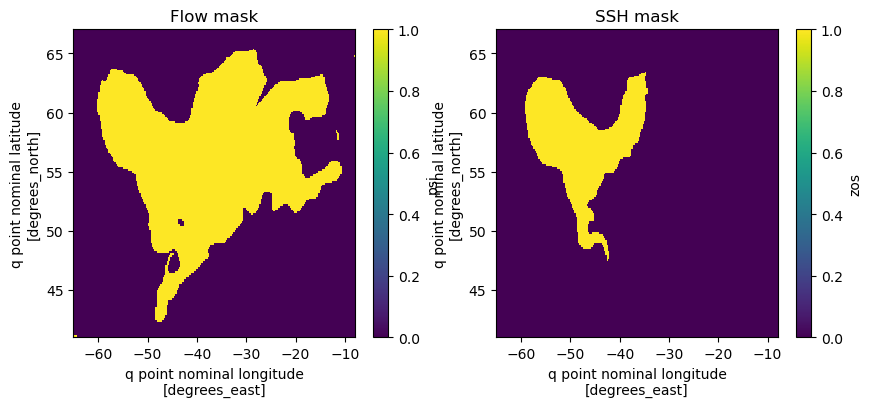

In [13]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))

SSH_cutoff = -1
flow_mask = xr.where(psi_NA_subpolar <= -flow_cutoff, 1, 0)
SSH_deep_mask = xr.where(SSH_subpolar >=SSH_cutoff, 1, 0)
SSH_shallow_mask = xr.where(SSH_subpolar <SSH_cutoff, 1, 0)

flow_mask.plot(ax = axes[0])
SSH_shallow_mask.plot(ax = axes[1])

axes[0].set_title('Flow mask')
axes[1].set_title('SSH mask')

Text(0.5, 1.0, 'Eastern subpolar gyre')

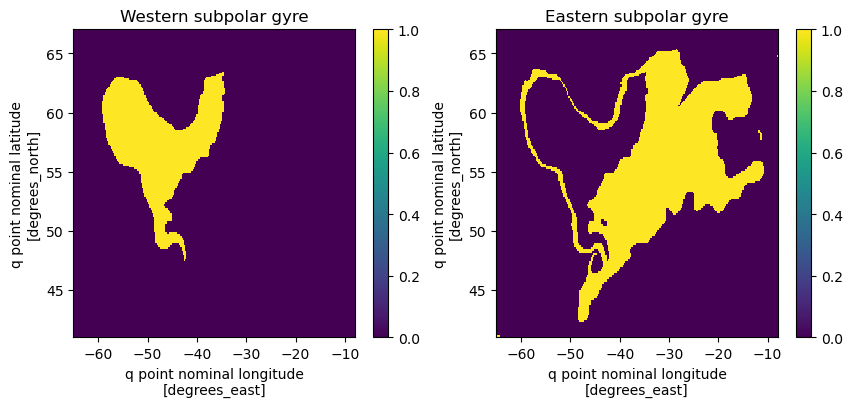

In [14]:
eastern_subpolar = xr.where(SSH_deep_mask + flow_mask == 2, 1, 0)
western_subpolar = xr.where(SSH_shallow_mask + flow_mask == 2, 1, 0)

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
western_subpolar.plot(ax = axes[0])
eastern_subpolar.plot(ax = axes[1])

axes[0].set_title('Western subpolar gyre')
axes[1].set_title('Eastern subpolar gyre')

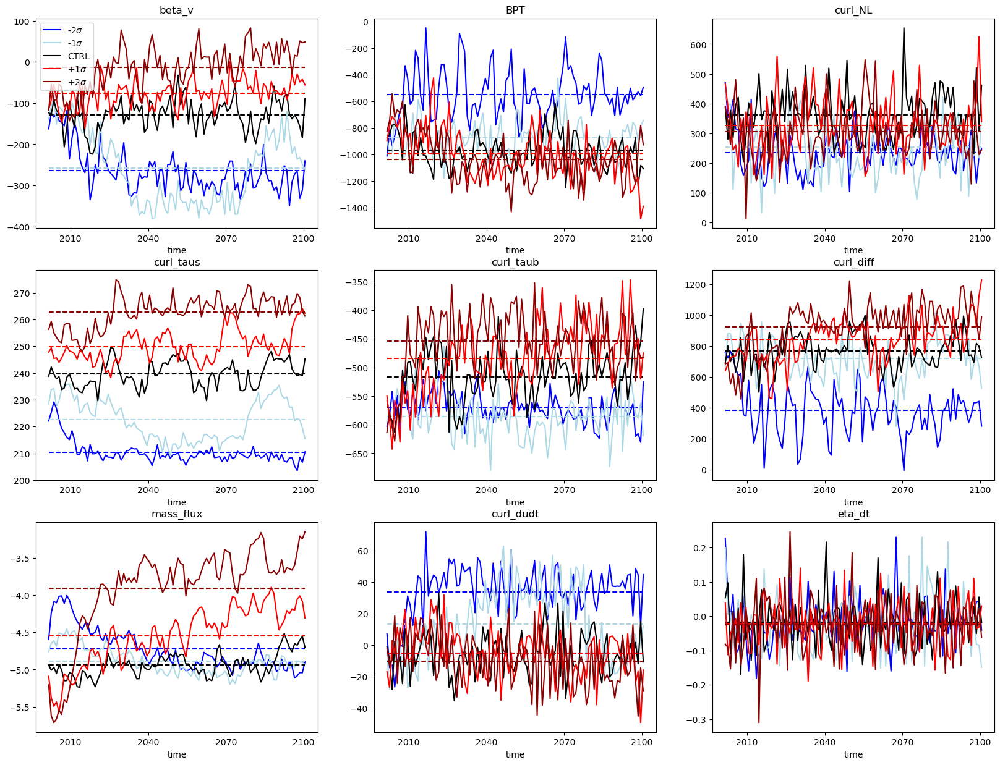

In [15]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name].astype(np.float32)
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name].astype(np.float32)
        var3 = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name].astype(np.float32)
        var = xr.concat([var1, var2, var3], dim = 'time')
        var = (var * area_bu_NA * eastern_subpolar).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()

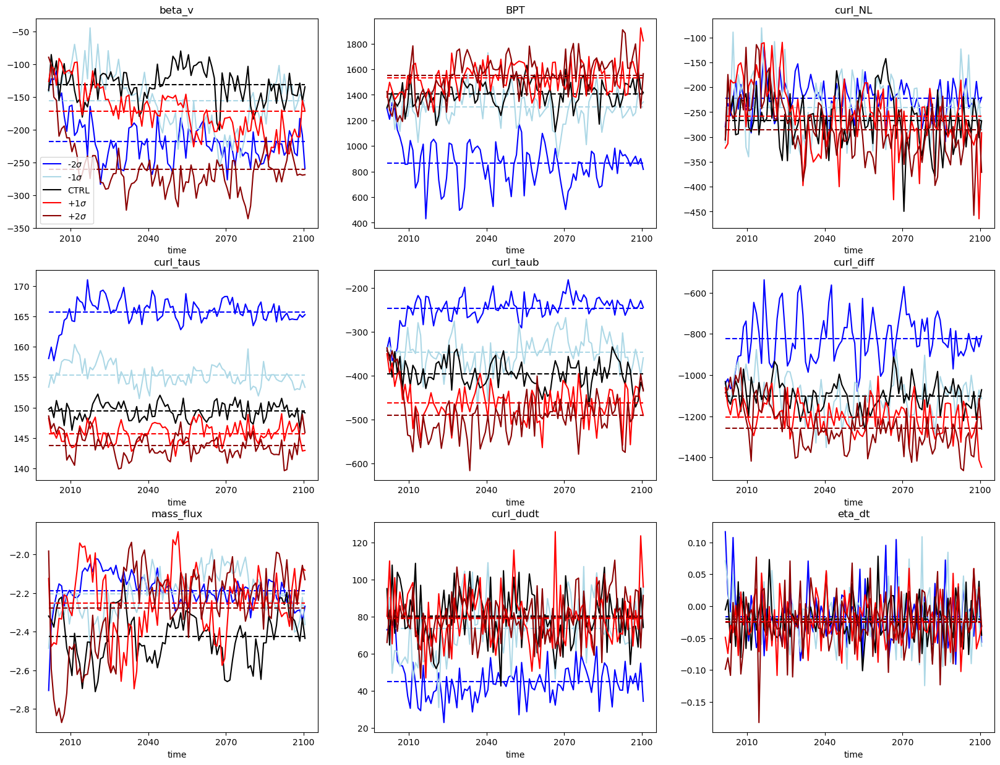

In [15]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 15))

expt_labels = ['-2$\sigma$', '-1$\sigma$', 'CTRL', '+1$\sigma$', '+2$\sigma$']
color_values = ['blue', 'lightblue', 'black', 'red', 'darkred']

for i, var_name in enumerate(var_list):
    for j, expt_name in enumerate(dir_names):
        var1 = xr.open_dataset(base_dir + expt_name + '/101-140/' + var_name + '.nc')[var_name].astype(np.float32)
        var2 = xr.open_dataset(base_dir + expt_name + '/141-180/' + var_name + '.nc')[var_name].astype(np.float32)
        var3 = xr.open_dataset(base_dir + expt_name + '/181-200/' + var_name + '.nc')[var_name].astype(np.float32)
        var = xr.concat([var1, var2, var3], dim = 'time')
        var = (var * area_bu_NA * western_subpolar).sum('xq').sum('yq').coarsen(time = 12).mean()  # To check interannual variability
        var.plot(ax = axes[int(i/3)][int(i%3)], label = expt_labels[j], color = color_values[j])
        axes[int(i/3)][int(i%3)].plot(var.time, var.mean('time').values * np.ones(var.shape[0]), color = color_values[j], ls = '--')
    axes[int(i/3)][int(i%3)].set_title(var_list[i])
axes[0][0].legend()